In [1]:
#hide
#all_examples

# Using fastai for semantic segmentation

Here we use U-net for semantic segmentation of deadwood. This notebook is based on a notebook the "Using fastai for segmentation" by Janne Mäyrä.

In [1]:
from pathlib import Path
import os
os.environ['PROJ_LIB']='/opt/conda/share/proj' # This should fix "ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed". Does not seem to work as of 17.5.2022. The error message disappears when running this cell a second time though. Using a workaround where using the command "export PROJ_LIB=/opt/conda/share/proj" in the Singularity terminal fixes the issue.
from drone_detector.processing.tiling import * #Commented this one out 18.3.2022 because Janne updated the tiling on 10.3.2022. Look into how to set up the new tiling.

from fastai.vision.all import *
from drone_detector.engines.fastai.data import *
from drone_detector.metrics import * # JaccardCoeffMulti is imported from here
import geopandas as gpd
import rasterio as rio
from rasterio import plot as rioplot
import wandb

## Tiling the data

In [2]:
tile_folder = Path('/scratch/deadwood/segmentation/models/proto10/train/images')
vector_folder = Path('/scratch/deadwood/segmentation/models/proto10/train/vectors')

outpath = Path('/scratch/deadwood/segmentation/models/proto10/processed')

if not os.path.exists(outpath): os.makedirs(outpath)

tiles = sorted(os.listdir(tile_folder))
vectors = sorted([f for f in os.listdir(vector_folder) if f.endswith('geojson')])
assert len(tiles) == len(vectors)

In [3]:
outpath = Path('/scratch/deadwood/segmentation/models/proto10/processed')

The vectors (.geojson files) do not have a column called 'groundwood', only a column called 'label' of type string ('groundwood' and 'uprightwood'). Here we convert the contents of the 'label' column to a column called 'groundwood' with integer values of 1 (uprightwood) and 2 (groundwood):

In [4]:
#  17.5.2022: This is still relevant if using files where the cell content is not corret, aka 1 or 2?
### For the older tiler before the update 10.3.2022
for fname in os.listdir(vector_folder):
    gdf = gpd.read_file(vector_folder/fname)
    gdf['groundwood'] = gdf.apply(lambda row: 2 if row.label == 'groundwood' else 1, axis=1)
    gdf.to_file(vector_folder/fname)

/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:362: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,
/opt/conda/lib/python3.9/site-packages/geopandas/io/file.py:

For semantic segmentation, we split the data into a 256 times 256 pixel grid. Vector files are then tiled and rasterized to the same grid, in such way that raster images are saved. This method saves target mask for each cell even if they don't contain any masks.

In [5]:
for t in tiles:
    if not os.path.exists(outpath/t[:-4]): os.makedirs(outpath/t[:-4])
    shp_fname = t.replace('tif', 'geojson')
    tilesize = 256
    tiler = Tiler(outpath=outpath/t[:-4], gridsize_x=tilesize, gridsize_y=tilesize, overlap=(0,0))
    tiler.tile_raster(str(tile_folder/t))
    #tiler.tile_and_rasterize_vector(vector_folder/shp_fname, column='groundwood')
    #tiler.tile_and_rasterize_vector('/scratch/deadwood/segmentation/models/proto10/train/images/14_1137.tif', '/scratch/deadwood/segmentation/models/proto10/train/vectors/14_1137.geojson', 'groundwood', keep_bg_only=False)
    tiler.tile_and_rasterize_vector(tile_folder/t, vector_folder/shp_fname, column='groundwood', keep_bg_only=False)
    #tile_and_rasterize_vector(self, path_to_raster:str, path_to_vector:str, column:str, keep_bg_only:bool=False)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

In [7]:
for d in [d for d in os.listdir(outpath) if d != 'models']:
    print(f"""{d} was split into {len(os.listdir(outpath/d/'raster_tiles'))} raster cells and {len(os.listdir(outpath/d/"rasterized_vector_tiles"))} vector cells""")

60_1267 was split into 64 raster cells and 64 vector cells
49_1256 was split into 64 raster cells and 64 vector cells
35_1206 was split into 64 raster cells and 64 vector cells
32_1189 was split into 64 raster cells and 64 vector cells
44_1234 was split into 64 raster cells and 64 vector cells
3_1091 was split into 64 raster cells and 64 vector cells
52_1259 was split into 64 raster cells and 64 vector cells
14_1137 was split into 64 raster cells and 64 vector cells


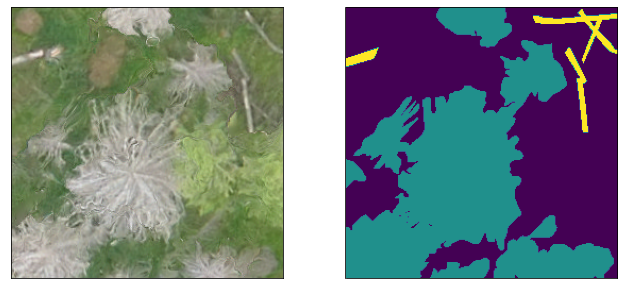

In [8]:
ex_file = random.sample(os.listdir(outpath/d/'rasterized_vector_tiles'), 1)[0]
fig, axs = plt.subplots(1,2, figsize=(11,5))
for a in axs:
    a.set_xticks([])
    a.set_yticks([])
with rio.open(outpath/d/"raster_tiles"/ex_file) as im:
    rioplot.show(im, ax=axs[0])
with rio.open(outpath/d/"rasterized_vector_tiles"/ex_file) as mask:
    rioplot.show(mask, ax=axs[1])
    #rioplot.show((mask, 1), ax=axs[1]) # Changed to (mask, 1) due to an error in image handling. (mask, 1) shows the 1st band which has all the classes, groundwood, upright wood and background. Changed from: rioplot.show(mask, ax=axs[1])

## Segmentation

We use 20 % of the data for validation. By setting `seed=96` we always use the same virtual plots for model validation.

In [2]:
outpath = Path('/scratch/deadwood/segmentation/models/proto10/processed/')

if not os.path.exists(outpath): os.makedirs(outpath)

fnames = [Path(f'{outpath}/{tile}/raster_tiles/{f}') 
         for tile in [til for til in os.listdir(outpath) if os.path.isdir(outpath/til) and til not in ['segmentation', 'models']]
         for f in os.listdir(outpath/tile/'rasterized_vector_tiles')]

dls = SegmentationDataLoaders.from_label_func('/scratch/deadwood/segmentation/models/proto10/processed',
                                              valid_pct=0.2, seed=96, bs=16, # 11.5.2022: Added "valid_pct=0.2" and "seed=96" so that the validation set always contains the same virtual plots.
                                              codes=['Standing', 'Fallen'],
                                              fnames = fnames,
                                              label_func=partial(label_from_different_folder,
                                                                 original_folder='raster_tiles',
                                                                 new_folder='rasterized_vector_tiles'),
                                              item_tfms=[Resize(256)],
                                                   batch_tfms= [
                                                       *aug_transforms(size=224),
                                                       Normalize.from_stats(*imagenet_stats)
                                              ],
                                              num_workers=0)

/opt/conda/lib/python3.9/site-packages/torch/_tensor.py:1142: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  ret = func(*args, **kwargs)


In [6]:
doc(SegmentationDataLoaders.from_label_func)

`label_from_different_folder` is a helper located in `drone_detector.engines.fastai.data`. That module also contains helpers to use with for instance multispectral images or time series of images.

Running `dls.show_batch` shows the original image in the left-hand column and the manually delineated an annotated target on the right-hand one.

In [10]:
#doc(dls.show_batch)

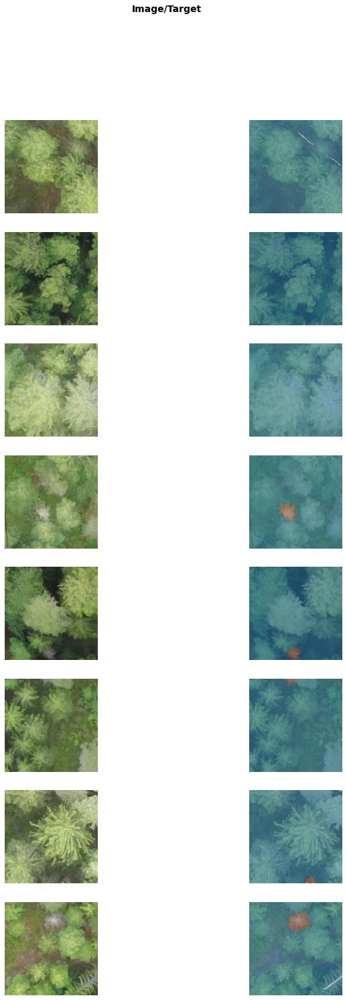

In [3]:
dls.show_batch(max_n=16)

## Training the model

**From Janne's notebook:**
*Train basic U-Net, using pretrained Resnet50 as the encoder. `to_fp16()` tells our model to use half precision training, thus using less memory. Loss function is `FocalLossFlat`, and for segmentation we need to specify `axis=1`. Metrics are `Dice` and `JaccardCoeff`, fairly standard segmentation metrics.*

We change the metrics to `DiceMulti()`, `JaccardCoeffMulti()`. `JaccardCoeffMulti` is in `drone_detector.metrics`.

`n_out` should be 3, (`n_out=3`) because we have 3 classes (groundwood, standing and the background).

In [41]:
doc(unet_learner)
#doc(JaccardCoeffMulti())
#doc(JaccardCoeff())

In [4]:
learn = unet_learner(dls, resnet50, pretrained=True, n_in=3, n_out=3,
                     metrics=[DiceMulti(), JaccardCoeffMulti()], loss_func=FocalLossFlat(axis=1)
                    ).to_fp16()

Search for a suitable learning rate.

In [9]:
#doc(unet_learner)
doc(learn.lr_find)

SuggestedLRs(valley=6.30957365501672e-05)

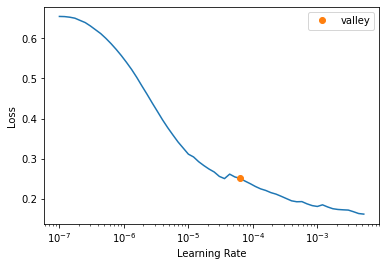

In [5]:
learn.lr_find()

Train the model for 2 epochs with encoder layers frozen and 10 epochs with all layers unfrozen.

In [25]:
doc(learn.fine_tune)
#doc(ShowGraphCallback)

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.016393,0.018593,0.636355,0.358074,00:28
1,0.015624,0.054599,0.717264,0.423574,00:28


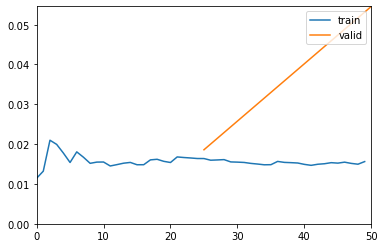

epoch,train_loss,valid_loss,dice_multi,jaccard_coeff_multi,time
0,0.015275,0.017367,0.646550,0.372598,00:30
1,0.013712,0.017453,0.768826,0.504830,00:29
2,0.014141,0.017671,0.721373,0.416523,00:28
3,0.012552,0.011974,0.794751,0.554597,00:28
4,0.011385,0.013180,0.781265,0.527528,00:29
5,0.010277,0.010476,0.804602,0.571957,00:30
6,0.009087,0.009869,0.815260,0.589402,00:29
7,0.008159,0.009176,0.816797,0.594487,00:29
8,0.007441,0.009082,0.802300,0.575923,00:31
9,0.006831,0.009187,0.805421,0.579208,00:31


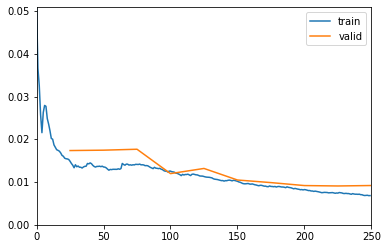

In [16]:
from fastai.callback.progress import ShowGraphCallback
learn.fine_tune(10, freeze_epochs=2, base_lr=1e-4, cbs=ShowGraphCallback)

Return to full precision.

In [18]:
learn.to_fp32()

Check results.

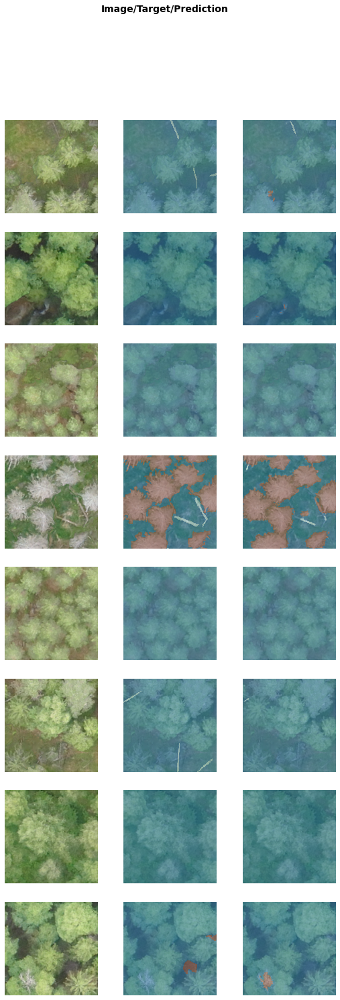

In [21]:
learn.show_results(max_n=8)

Export the model for later use.

In [22]:
learn.path = Path('/scratch/deadwood/segmentation/models/proto10/models')
learn.export('unet-segmentation-test-10-00.pkl')

## Test with holdout

This part is from U-Net Hiidenportti.ipynb  

**31.5.2022:** `predict_segmentation_fastai` doesn't create any files anymore.

**25.5.2022:** It works! There had been an issue with the Tiler, where some tiles were of size 257x256, which caused a crash.

**20.5.2022:** Running the third cell resulted in it only printing `Folder exists`. This was due to that the `processing_dir='temp'` already existed. Deleting the`temp` folder or using a different folder resolves this issue.

**17.5.2022:** Does not seem to work?  

In [2]:
from drone_detector.engines.fastai.predict import predict_segmentation_fastai
# from drone_detector.engines.fastai.predict import predict_segmentation is used in U-Net Hiidenportti.ipynb.

In [3]:
test_rasters = [f'/scratch/deadwood/segmentation/models/proto10/test/images/{f}'
                for f in os.listdir('/scratch/deadwood/segmentation/models/proto10/test/images/') if f.endswith('tif')]

In [4]:
test_rasters

['/scratch/deadwood/segmentation/models/proto10/test/images/16_1140.tif',
 '/scratch/deadwood/segmentation/models/proto10/test/images/34_1200.tif']

Moved the `outfile_name` outfiles to `/scratch/deadwood/segmentation/models/proto10/test/results/`

In [5]:
for t in test_rasters:
    outfile_name = f'/scratch/deadwood/segmentation/models/proto10/test/predictions/{t.split("/")[-1]}' # 31.5.2022: Moved the result files to /scratch/deadwood/segmentation/models/proto10/test/predictions and changed the output folder to be the same. Old output folder = /scratch/deadwood/segmentation/models/proto10/test/results/
    # 17.5.2022: Changed from "predict_segmentation" to "predict_segmentation_fastai".
    predict_segmentation_fastai('/scratch/deadwood/segmentation/models/proto10/models/unet-segmentation-test-10-00.pkl', t, outfile_name, 
                         processing_dir='test-temp0', use_tta=False,
                         tile_size=256, tile_overlap=128) # tile_size=230 and tile_overlap=115 in the original code

Reading and tiling /scratch/deadwood/segmentation/models/proto10/test/images/16_1140.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:370: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:104: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files
Reading and tiling /scratch/deadwood/segmentation/models/proto10/test/images/34_1200.tif to 256x256 tiles with overlap of 128px


0it [00:00, ?it/s]

Starting prediction


/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:370: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:104: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


Rasterizing predictions


0it [00:00, ?it/s]

Merging predictions
Postprocessing predictions
Removing intermediate files


In [6]:
outfile_name

'/scratch/deadwood/segmentation/models/proto10/test/predictions/34_1200.tif'

## From [U-Net Hiidenportti](https://github.com/tvuor/drone_detector/blob/master/analyses/U-Net%20Hiidenportti.ipynb)

In [7]:
from osgeo import gdal, ogr

In [26]:
raster_path = '/scratch/deadwood/segmentation/models/proto10/test/images/' # The virtual plots
#vector_path = '/scratch/deadwood/segmentation/models/proto10/test/results' # Digitized deadwood
#rasterized_vector_path = '/scratch/deadwood/segmentation/models/proto10/test/vectors' # The rasterized predictions created in the "Test with holdout" part by predict_segmentation_fastai.
vector_path = '/scratch/deadwood/segmentation/models/proto10/test/vectors' # Digitized deadwood
rasterized_vector_path = '/scratch/deadwood/segmentation/models/proto10/test/results' # 31.5.2022: Or is this supposed to be an empty folder? # The rasterized predictions created in the "Test with holdout" part by predict_segmentation_fastai.

raster_files = sorted([f for f in os.listdir(raster_path)])
vector_files = sorted([f for f in os.listdir(vector_path)])

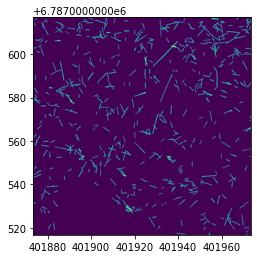

In [8]:
with rio.open('/scratch/deadwood/segmentation/models/proto10/test/results/16_1140.tif') as im:
    rioplot.show(im)#, ax=axs[0])

#with rio.open(outpath/d/"raster_tiles"/ex_file) as im:
 #   rioplot.show(im, ax=axs[0])

In [9]:
with rio.open('/scratch/deadwood/segmentation/models/proto10/test/predictions/16_1140.tif') as im:
    rioplot.show(im)#, ax=axs[0])

RasterioIOError: /scratch/deadwood/segmentation/models/proto10/test/predictions/16_1140.tif: No such file or directory

In [ ]:
#vector_path

In [ ]:
#fname

In [ ]:
#for fname in os.listdir(vector_path):
#    gdf = gpd.read_file(vector_path/fname)
#    gdf['groundwood'] = gdf.apply(lambda row: 2 if row.label == 'groundwood' else 1, axis=1)
#    gdf.to_file(vector_path/fname)

In [27]:
from tqdm import tqdm
column = 'groundwood'
for r, v in tqdm(zip(raster_files, vector_files)):
    source_raster = gdal.Open(f'{raster_path}/{r}', gdal.GA_ReadOnly)
    source_vector = ogr.Open(f'{vector_path}/{v}')
    source_vector_layer = source_vector.GetLayer()

    output_raster = gdal.GetDriverByName('gtiff').Create(f'{rasterized_vector_path}/{r}',
                                                         source_raster.RasterXSize,
                                                         source_raster.RasterYSize,
                                                         1,
                                                         gdal.GDT_Int16)
    output_raster.SetProjection(source_raster.GetProjectionRef())
    output_raster.SetGeoTransform(source_raster.GetGeoTransform())
    band = output_raster.GetRasterBand(1)
    #band.SetNoDataValue(0)
    gdal.RasterizeLayer(output_raster, [1], source_vector_layer, options=[f'ATTRIBUTE={column}'])

    band = None
    source_vector = None
    source_raster = None
    output_raster = None   

2it [00:00,  7.06it/s]


In [28]:
import rasterio as rio
import rasterio.mask as rio_mask
from shapely.geometry import box

result_path = '/scratch/deadwood/segmentation/models/proto10/test/predictions' 

for f, pred, truth in zip(sorted(os.listdir(vector_path)), sorted(os.listdir(result_path)), sorted(os.listdir(rasterized_vector_path))):
    temp_gdf = gpd.read_file(f'{vector_path}/{f}')
    
    shapes = [box(*temp_gdf.total_bounds)]
    
    with rio.open(f'{result_path}/{pred}') as src:
        out_im, out_tfm = rio_mask.mask(src, shapes, crop=True)
        out_meta = src.meta

    out_meta.update({"driver": "GTiff",
                     "height": out_im.shape[1],
                     "width": out_im.shape[2],
                     "transform": out_tfm})
    
    
    with rio.open(f'{result_path}/{pred}', "w", **out_meta) as dest:
        dest.write(out_im)
        
    with rio.open(f'{rasterized_vector_path}/{truth}') as src:
        out_im, out_tfm = rio_mask.mask(src, shapes, crop=True)
        out_meta = src.meta

    out_meta.update({"driver": "GTiff",
                     "height": out_im.shape[1],
                     "width": out_im.shape[2],
                     "transform": out_tfm})
    
    
    with rio.open(f'{rasterized_vector_path}/{truth}', "w", **out_meta) as dest:
        dest.write(out_im)

In [29]:
import matplotlib.pyplot as plt
import rasterio.plot as rioplot

<AxesSubplot:>

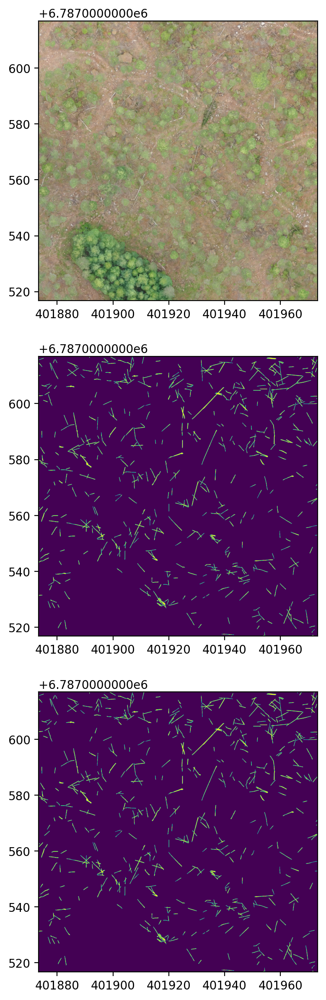

In [30]:
fig, axs = plt.subplots(3,1, figsize=(7,15), dpi=200)

ix = random.randint(0,1)
truths = sorted(os.listdir(rasterized_vector_path))
preds = sorted(os.listdir(result_path))

im = rio.open(f'{raster_path}/{truths[ix]}')
rioplot.show(im, ax=axs[0])

truth = rio.open(f'{rasterized_vector_path}/{truths[ix]}')
rioplot.show(truth, ax=axs[1], vmin=0, vmax=2)

pred = rio.open(f'{result_path}/{truths[ix]}')
rioplot.show(pred, ax=axs[2], vmin=0, vmax=2)

In [ ]:
def binary_mask_iou(pred, truth, label=1):
    p = np.where(pred == label, 1, 0).ravel()
    t = np.where(truth == label, 1, 0).ravel()
    inter = (p*t).sum()
    union = (p+t).sum()
    #if t.sum() == 0: return 'No ground truth'
    #elif p.sum() == 0: return 'No predicted class'
    return inter/(union-inter) #if union > 0 else None

In [ ]:
truth_vals = truth.read()
pred_vals = pred.read()
standing_iou = binary_mask_iou(truth_vals, pred_vals, 1)
standing_iou

In [ ]:
fallen_iou = binary_mask_iou(truth_vals, pred_vals, 2)
fallen_iou

In [ ]:
(standing_iou + fallen_iou) / 2

In [ ]:
np.where(pred==0, 1, 0).ravel().shape

In [ ]:
np.where(truth==0, 1, 0).ravel().shape

In [ ]:
bg_preds = np.array([])
bg_truths = np.array([])
standing_preds = np.array([])
standing_truths = np.array([])
fallen_preds = np.array([])
fallen_truths = np.array([])


for t, p in list(zip(truths, preds)):
    truth = rio.open(f'{rasterized_vector_path}/{t}').read()
    pred = rio.open(f'{result_path}/{p}').read()
    bg_preds = np.append(bg_preds, np.where(pred==0, 1, 0).ravel())
    bg_truths = np.append(bg_truths, np.where(truth==0, 1, 0).ravel())
    standing_preds = np.append(standing_preds, np.where(pred==1, 1, 0).ravel())
    standing_truths = np.append(standing_truths, np.where(truth==1, 1, 0).ravel())
    fallen_preds = np.append(fallen_preds, np.where(pred==2, 1, 0).ravel())
    fallen_truths = np.append(fallen_truths, np.where(truth==2, 1, 0).ravel())
    
bg_inter = (bg_preds*bg_truths).sum()
bg_union = (bg_preds+bg_truths).sum()
standing_inter = (standing_preds*standing_truths).sum()
standing_union = (standing_preds+standing_truths).sum()
fallen_inter = (fallen_preds*fallen_truths).sum()
fallen_union = (fallen_preds+fallen_truths).sum()

In [ ]:
fallen_preds.sum() * 0.04**2

In [ ]:
fallen_truths.sum() * 0.04**2

In [ ]:
standing_preds.sum() * 0.04**2

In [ ]:
standing_truths.sum() * 0.04**2

In [ ]:
bg_iou = bg_inter / (bg_union - bg_inter)
standing_iou = standing_inter / (standing_union - standing_inter)
fallen_iou = fallen_inter / (fallen_union - fallen_inter)

In [ ]:
bg_iou

In [ ]:
standing_iou

In [ ]:
standing_iou

In [ ]:
fallen_iou

In [ ]:
(standing_iou + fallen_iou) / 2

In [ ]:
(bg_iou + standing_iou + fallen_iou) / 3

In [ ]:
bg_dice = 2 * bg_inter / bg_union
fallen_dice = 2 * fallen_inter / fallen_union
standing_dice = 2 * standing_inter / standing_union

In [ ]:
full_inter = fallen_inter + standing_inter
full_union = fallen_union + standing_union

In [ ]:
2 * full_inter / full_union

In [ ]:
def accuracy_annotated(pred, truth, label):
    pred = pred.copy()
    pred[truth == 0] = 0
    p = np.where(pred == label, 1, 0).ravel()
    t = np.where(truth == label, 1, 0).ravel()
    return p.sum() / t.sum()

In [ ]:
accuracy_annotated(pred_vals, truth_vals, 2)

In [ ]:
standing_masked_preds = np.array([])
standing_truths = np.array([])
fallen_masked_preds = np.array([])
fallen_truths = np.array([])


for t, p in list(zip(truths, preds)):
    truth = rio.open(f'{rasterized_vector_path}/{t}').read()
    pred = rio.open(f'{result_path}/{p}').read()
    pred[truth == 0] = 0
    standing_masked_preds = np.append(standing_masked_preds, np.where(pred==1, 1, 0).ravel())
    standing_truths = np.append(standing_truths, np.where(truth==1, 1, 0).ravel())
    fallen_masked_preds = np.append(fallen_masked_preds, np.where(pred==2, 1, 0).ravel())
    fallen_truths = np.append(fallen_truths, np.where(truth==2, 1, 0).ravel())
    
standing_ann_acc = standing_masked_preds.sum() / standing_truths.sum()
fallen_ann_acc = fallen_masked_preds.sum() / fallen_truths.sum()

In [ ]:
standing_ann_acc

In [ ]:
fallen_ann_acc

## From [Using fastai for segmentation](https://jaeeolma.github.io/drone_detector/examples.fastai.segmentation.html)

Some helper functions for inference, such as removing all resizing transforms.

In [7]:
def label_func(fn):
    return str(fn).replace('raster_tiles', 'mask_tiles')

@patch 
def remove(self:Pipeline, t):
    for i,o in enumerate(self.fs):
        if isinstance(o, t.__class__): self.fs.pop(i)
            
@patch
def set_base_transforms(self:DataLoader):
    attrs = ['after_item', 'after_batch']
    for i, attr in enumerate(attrs):
        tfms = getattr(self, attr)
        for j, o in enumerate(tfms):
            if hasattr(o, 'size'):
                tfms.remove(o)
            setattr(self, attr, tfms)

Load learners and remove all resizing transforms. If you run out of memory just restart the kernel.

In [3]:
doc(load_learner)

In [5]:
testlearn = load_learner('/scratch/deadwood/segmentation/models/proto10/models/unet-segmentation-test-10.pkl', cpu=False)
testlearn.dls.valid.set_base_transforms()

In [7]:
doc(testlearn.predict)

In [8]:
import PIL
def unet_predict(fn):
    image = np.array(PIL.Image.open(fn))
    mask = testlearn.predict(PILImage.create(image))[0].numpy()
    img = image
    img[:,:,0][mask==0] = 0
    img[:,:,1][mask==0] = 0
    img[:,:,2][mask==0] = 0
    img = PIL.Image.fromarray(img.astype(np.uint8))
    return img

In [11]:

test_images = [f'/scratch/deadwood/segmentation/models/proto10/test/images/{f}' for f in os.listdir('/scratch/deadwood/segmentation/models/proto10/test/images/')]

### First result

#### Calculating metrics

Here we calculate the model metrics: `accuracy`, `precision`, `recall`, `Dice (F1)`, and `IoU (Jaccard Index`.

/opt/conda/lib/python3.9/site-packages/fastai/metrics.py:370: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/scratch/deadwood/drone_detector/drone_detector/metrics.py:104: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


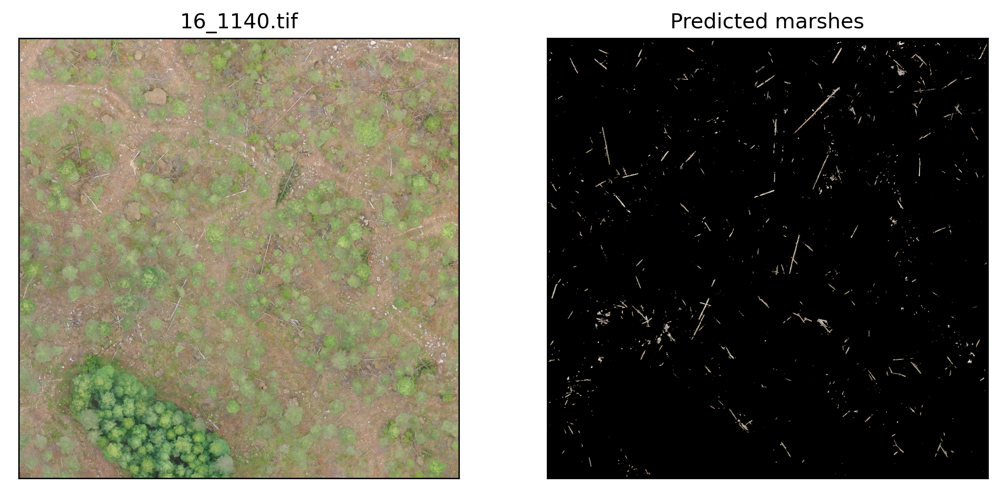

In [12]:
patch_pred = unet_predict(test_images[0])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[0]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[0].split('/')[-1])
axs[1].set_title('Predicted downed deadwood')
plt.show()

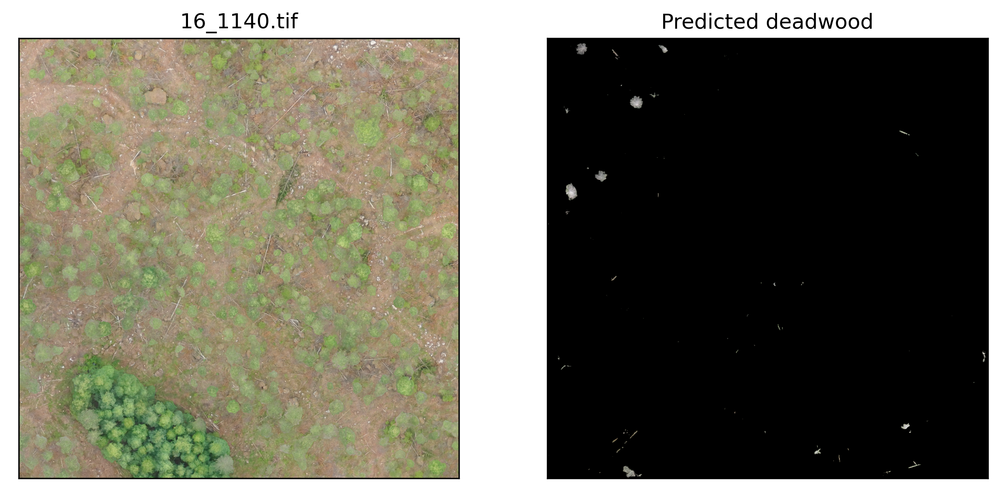

In [15]:
fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[0]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[0].split('/')[-1])
axs[1].set_title('Predicted deadwood')
plt.show()

### Second result

In [ ]:
patch_pred = unet_predict(test_images[1])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[1]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[1].split('/')[-1])
axs[1].set_title('Predicted deadwood')
plt.show()

## Calculating metrics

***
### From the original notebook:

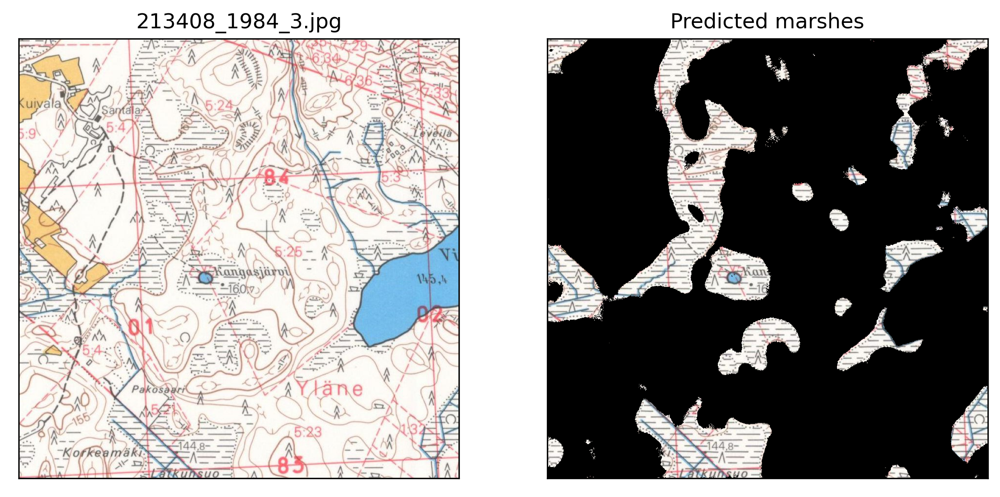

In [ ]:
patch_pred = unet_predict(test_images[1])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[1]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[1].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Third result

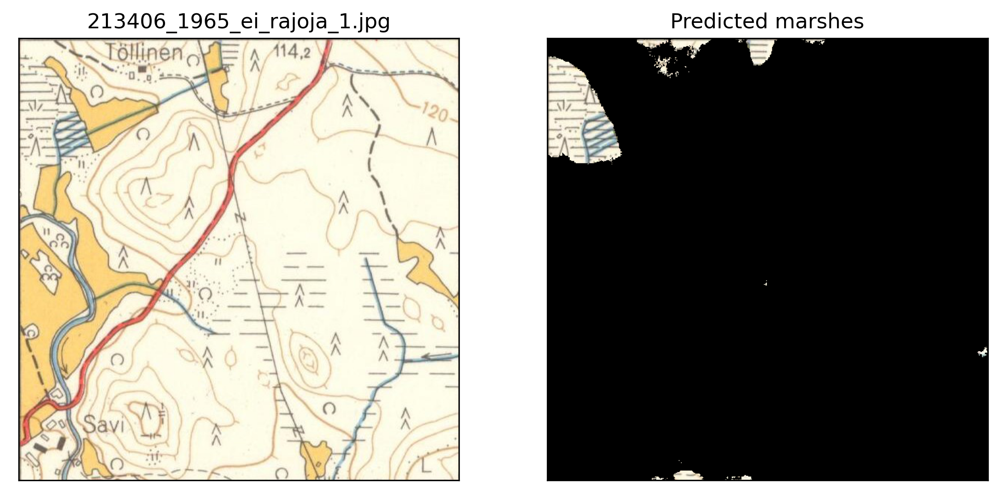

In [ ]:
patch_pred = unet_predict(test_images[2])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[2]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[2].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

Fourth example.

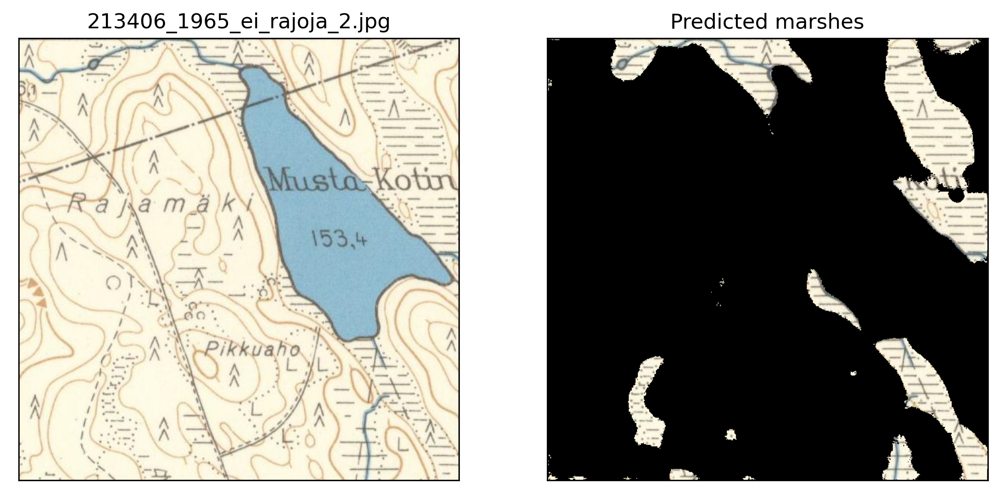

In [ ]:
patch_pred = unet_predict(test_images[3])

fig, axs = plt.subplots(1,2, figsize=(10,5),dpi=300)
for a in axs:
    a.set_yticks([])
    a.set_xticks([])
axs[0].imshow(PIL.Image.open(test_images[3]))
axs[1].imshow(patch_pred)
axs[0].set_title(test_images[3].split('/')[-1])
axs[1].set_title('Predicted marshes')
plt.show()

In [ ]:
# hide

from nbdev.export import notebook2script
notebook2script()
!nbdev_build_docs

Converted 00_utils.ipynb.
Converted 01_metrics.ipynb.
Converted 10_processing.tiling.ipynb.
Converted 11_processing.coordinates.ipynb.
Converted 12_processing.coco.ipynb.
Converted 13_processing.postprocessing.ipynb.
Converted 20_engines.icevision.models.ipynb.
Converted 21_engines.icevision.predict.ipynb.
Converted 30_engines.fastai.data.ipynb.
Converted 31_engines.fastai.losses.ipynb.
Converted 32_engines.fastai.augmentations.ipynb.
Converted 33_engines.fastai.predict.ipynb.
Converted 40_engines.detectron2.predict.ipynb.
Converted examples.fastai.segmentation.ipynb.
Converted examples.tiling.ipynb.
Converted index.ipynb.
Converted overview.engines.ipynb.
converting: /scratch/mayrajan/drone_detector/nbs/examples.fastai.segmentation.ipynb
converting /scratch/mayrajan/drone_detector/nbs/index.ipynb to README.md
